<h1 style="text-align: center;">CS 6476 - Computer Vision </h1>
<h2 style="text-align: center;">Problem Set 5 - Optic Flow</h2>

In [33]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import copy as cp
import random
import math
import sys
import os
from PIL import Image

### Part 1: Gaussian and Laplacian Pyramids

In [34]:
def loadSeq(path):
    directory =os.path.join(path)
    seq = []
    for imageName in os.listdir(directory):
        print(os.path.join(directory+imageName))
        seq.append(cv2.imread(os.path.join(directory+imageName),0))
    return seq    
                   
dataSeq1 = loadSeq('./images/DataSeq1/')
dataSeq2 = loadSeq('./images/DataSeq2/')
juggle = loadSeq('./images/Juggle/')
taxis = loadSeq('./images/Taxis/')
testSeq = loadSeq('./images/TestSeq/')

./images/DataSeq1/yos_img_01.jpg
./images/DataSeq1/yos_img_02.jpg
./images/DataSeq1/yos_img_03.jpg
./images/DataSeq2/0.png
./images/DataSeq2/1.png
./images/DataSeq2/2.png
./images/Juggle/0.png
./images/Juggle/1.png
./images/Juggle/2.png
./images/Taxis/taxi-00.jpg
./images/Taxis/taxi-00.tif
./images/Taxis/taxi-01.jpg
./images/Taxis/taxi-01.tif
./images/Taxis/taxi-02.jpg
./images/Taxis/taxi-02.tif
./images/Taxis/taxi-03.jpg
./images/Taxis/taxi-03.tif
./images/Taxis/taxi-04.jpg
./images/Taxis/taxi-04.tif
./images/Taxis/taxi-05.jpg
./images/Taxis/taxi-05.tif
./images/Taxis/taxi-06.jpg
./images/Taxis/taxi-06.tif
./images/Taxis/taxi-07.jpg
./images/Taxis/taxi-07.tif
./images/Taxis/taxi-08.jpg
./images/Taxis/taxi-08.tif
./images/Taxis/taxi-09.jpg
./images/Taxis/taxi-09.tif
./images/Taxis/taxi-10.jpg
./images/Taxis/taxi-10.tif
./images/Taxis/taxi-11.jpg
./images/Taxis/taxi-11.tif
./images/Taxis/taxi-12.jpg
./images/Taxis/taxi-12.tif
./images/Taxis/taxi-13.jpg
./images/Taxis/taxi-13.tif
./image

In [35]:
def REDUCE(im,ksize=5):
    
    dst = cv2.GaussianBlur(im,(5,5),0,2)[::2,::2].astype(np.uint8)
    return dst.astype(np.uint8)

def pyramidGauss(im,ksize=5,nlevels=4):
    pyramid = []
    pyramid.append(im)
    for i in np.arange(nlevels-1):
        pyramid.append(REDUCE(pyramid[i],ksize))
    return np.array(pyramid)

4


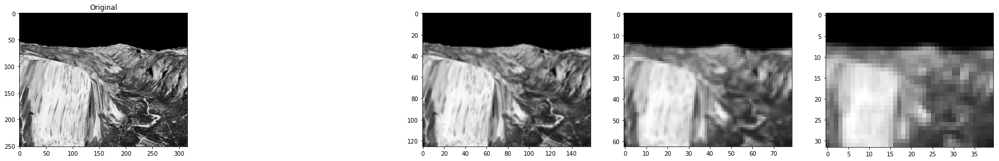

In [36]:
pyramid1 = pyramidGauss(dataSeq1[0])



print(len(pyramid1))

plt.figure(figsize=(30,30))
plt.subplot(151),plt.imshow(dataSeq1[0],'gray'),plt.title('Original')


plt.subplot(153),plt.imshow(pyramid1[1],'gray')

plt.subplot(154),plt.imshow(pyramid1[2],'gray')
plt.subplot(155),plt.imshow(pyramid1[3],'gray')


plt.show()

In [37]:
def EXPAND(im):
    return cv2.resize(im,(im.shape[1]*2,im.shape[0]*2))


def norm(im):
    im = cp.deepcopy(im)
    im = np.array([(i-im.min())*255/(im.max()-im.min()) for i in im]).reshape(im.shape).astype(np.uint8)
    return im
    
def pyramidLap(pyramid):
    pyramidLap = []
    for i in np.arange(len(pyramid)-1):
        imNext = cp.deepcopy(pyramid[i+1])
        imNext = EXPAND(imNext)
        im = cp.deepcopy(pyramid[i]) 
        imNext = imNext[:im.shape[0],:im.shape[1]] 
        g = (im.astype(np.float64)-imNext.astype(np.float64)).astype(np.float64)
        g = norm(g)
        pyramidLap.append(g)
    pyramidLap.append(pyramid[len(pyramid)-1])
    return pyramidLap
        

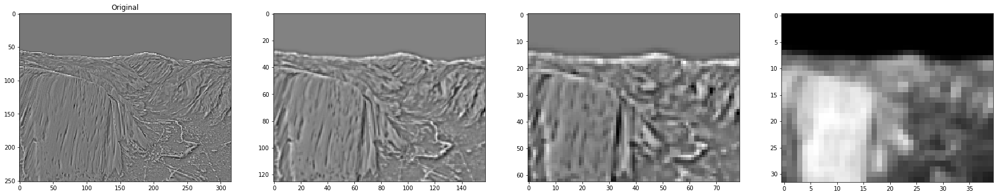

In [38]:

pyramidL = pyramidLap(pyramidGauss(dataSeq1[0]))

plt.figure(figsize=(30,30))
plt.subplot(141),plt.imshow(pyramidL[0],cmap='gray'),plt.title('Original')

plt.subplot(142),plt.imshow(pyramidL[1],cmap='gray')

plt.subplot(143),plt.imshow(pyramidL[2],cmap='gray')

plt.subplot(144),plt.imshow(pyramid1[3],cmap='gray')

plt.show()

### Part 2 : Lucas Kanade optic flow 

In [39]:
def checkGrayScale(img):
    img = cp.deepcopy(img)
    if(len(img.shape)>2):
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img

def diffIm(im1,im2):
    return np.subtract(im1.astype(np.float),im2.astype(np.float)).astype(np.float)

def gradients(im):
    kernely = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
    kernelx = np.array([[1,0,-1],[1,0,-1],[1,0,-1]])
    edges_x = cv2.filter2D(im,cv2.CV_64F,kernelx)
    edges_y = cv2.filter2D(im,cv2.CV_64F,kernely)
    return (edges_x,edges_y)
    
def LKstep(frame1,frame2,w_size=5):
    frame1 = checkGrayScale(frame1)
    frame2 = checkGrayScale(frame2)
    height,width = frame1.shape
    
    It = diffIm(frame1,frame2)
    Ix,Iy = gradients(frame1)
    Ixx = Ix**2
    Iyy = Iy**2
    Ixy = Ix*Iy
    Ixt = Ix*It
    Iyt = Iy*It
    U = np.zeros((height,width)).astype(np.float)
    V = np.zeros((height,width)).astype(np.float)
    R = np.zeros(Ix.shape).astype(np.float)
    for i in np.arange(w_size//2,height-w_size//2):
        for j in np.arange(w_size//2,width-w_size//2):     
            mini = i-w_size//2
            maxi = i+w_size//2+1
            minj = j-w_size//2
            maxj = j+w_size//2+1
            Mxy = (Ixy[mini:maxi,minj:maxj]).sum()
            M = np.array([[(Ixx[mini:maxi,minj:maxj]).sum(),Mxy],[Mxy,(Iyy[mini:maxi,minj:maxj]).sum()]])
            b = np.array([[-(Ixt[mini:maxi,minj:maxj]).sum()],[-(Iyt[mini:maxi,minj:maxj]).sum()]])
            A = np.linalg.lstsq(M,b,rcond=None)[0]
            U[i,j] = A[0]
            V[i,j] = A[1]
    return U,V
    
    
    
    

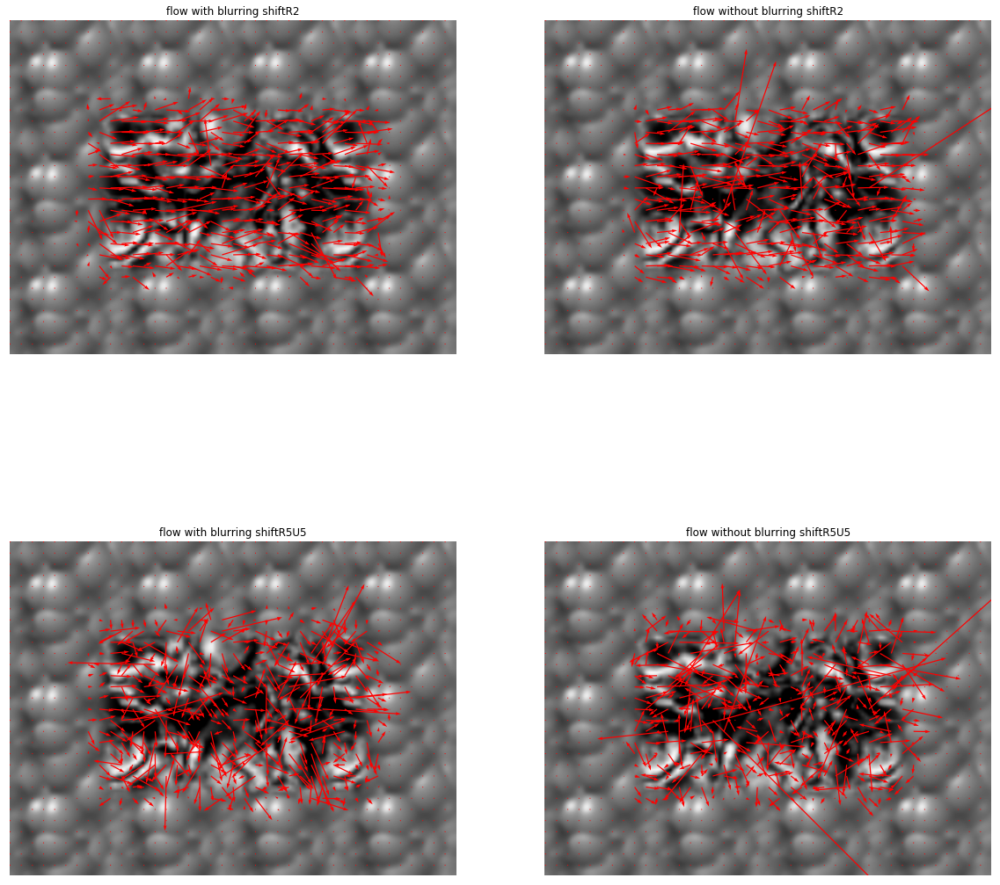

In [40]:
shift0 = cp.deepcopy(testSeq[1])
shift2 =cp.deepcopy(testSeq[3])
smoothShift0 = cv2.GaussianBlur(shift0,(17,17),10)
smoothShift2 = cv2.GaussianBlur(shift2,(17,17),10)

shiftR5u5 = cp.deepcopy(testSeq[6])
smoothShiftR5u5 = cv2.GaussianBlur(shiftR5u5,(17,17),10)


U,V = LKstep(smoothShift0, smoothShift2)
U1,V1 = LKstep(shift0, shift2)
def plotQuiver(U,V,img):
    x = np.arange(0, img.shape[1], 1).astype(np.uint)
    y = np.arange(0, img.shape[0], 1).astype(np.uint)
    x, y = np.meshgrid(x, y)
#     plt.figure(figsize=(10,10))
    fig = plt.imshow(img, cmap='gray', interpolation='bicubic')
    plt.axis('off')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    step = img.shape[0] // 30
    plt.quiver(x[::step, ::step], y[::step, ::step],U[::step, ::step], V[::step, ::step],
           color='r')
    return fig
    


plt.figure(figsize=(20,20))
plt.subplot(221),plotQuiver(U,V,shift0),plt.title('flow with blurring shiftR2')
plt.subplot(222),plotQuiver(U1,V1,shift0),plt.title('flow without blurring shiftR2')
U2,V2 = LKstep(smoothShift0, smoothShiftR5u5)
U3,V3 = LKstep(shift0, shiftR5u5)
plt.subplot(223),plotQuiver(U2,V2,shift0),plt.title('flow with blurring shiftR5U5')
plt.subplot(224),plotQuiver(U3,V3,shift0),plt.title('flow without blurring shiftR5U5')


plt.show()



I use a 17x17 kernel to blur the images with a 11 standard deviation. It is clear that blurring enhance the precision of Lukas Kanade optical flow measurements.

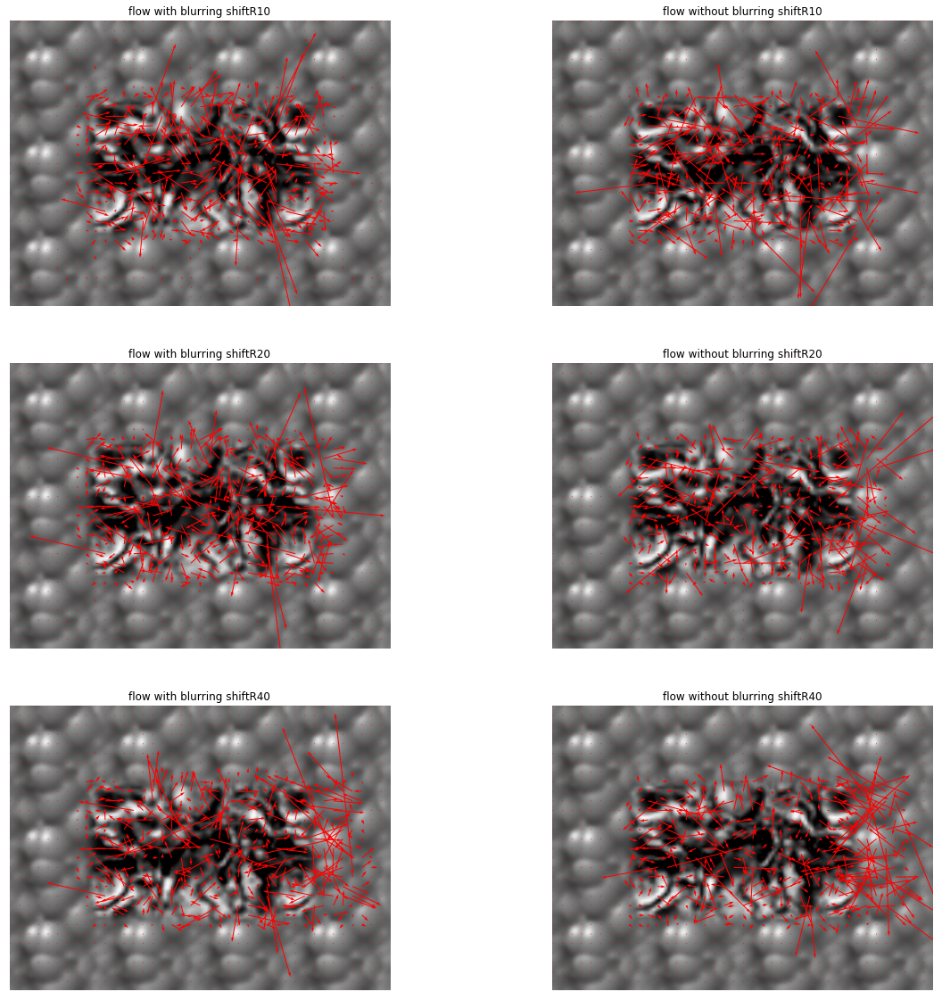

In [41]:
shiftR10 = cp.deepcopy(testSeq[2])
smoothShiftR10 = cv2.GaussianBlur(shiftR10,(17,17),11)

shiftR20 = cp.deepcopy(testSeq[4])
smoothShiftR20 = cv2.GaussianBlur(shiftR20,(17,17),11)

shiftR40 = cp.deepcopy(testSeq[5])
smoothShiftR40 = cv2.GaussianBlur(shiftR40,(17,17),11)


plt.figure(figsize=(20,20))
U,V = LKstep(smoothShift0, smoothShiftR10)
U1,V1 = LKstep(shift0, shiftR10)

plt.subplot(321),plotQuiver(U,V,shift0),plt.title('flow with blurring shiftR10')
plt.subplot(322),plotQuiver(U1,V1,shift0),plt.title('flow without blurring shiftR10')
U2,V2 = LKstep(smoothShift0, smoothShiftR20)
U3,V3 = LKstep(shift0, shiftR20)
plt.subplot(323),plotQuiver(U2,V2,shift0),plt.title('flow with blurring shiftR20')
plt.subplot(324),plotQuiver(U3,V3,shift0),plt.title('flow without blurring shiftR20')
U4,V4 = LKstep(smoothShift0, smoothShiftR40)
U5,V5 = LKstep(shift0, shiftR40)
plt.subplot(325),plotQuiver(U4,V4,shift0),plt.title('flow with blurring shiftR40')
plt.subplot(326),plotQuiver(U5,V5,shift0),plt.title('flow without blurring shiftR40'),plt.savefig('ps5-2-2-0.png')
plt.show()

As expected, Lukas Kanade methods is less accurate with bigger movements even with blurring. Hence, the results are less precise than the previous ones.

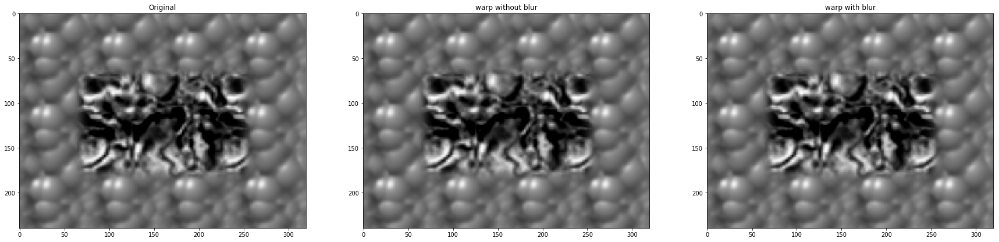

In [42]:
def warp(img,u,v):
    mapx = cp.deepcopy(u)
    mapy = cp.deepcopy(v)
    height,width = img.shape
    # build the maps from u and v
    for i in np.arange(height):
        for j in np.arange(width):
            mapx[i,j] = j - u[i,j]
            mapy[i,j] = i - v[i,j]
            if(mapx[i,j]>=width):
                mapx[i,j]=width-1
            if(mapy[i,j]>=height):
                mapy[i,j]=height
            if(mapx[i,j]<0):
                mapx[i,j]=0
            if(mapy[i,j]<0):
                mapy[i,j]=0
    # Only works with float32... 
    out_im = cv2.remap(img.astype(np.float32),mapx.astype(np.float32),mapy.astype(np.float32),cv2.INTER_LINEAR)
    return out_im

U,V = LKstep(shift0,shift2)
synt = warp(shift0,U,V)

U1,V1 = LKstep(smoothShift0,smoothShift2)
synt2 = warp(shift0,U1,V1)



plt.figure(figsize=(30,30))
plt.subplot(131),plt.imshow(testSeq[1],cmap='gray'),plt.title('Original')
plt.subplot(132),plt.imshow(synt.astype(np.uint8),cmap='gray'),plt.title('warp without blur')
plt.subplot(133),plt.imshow(synt2.astype(np.uint8),cmap='gray'),plt.title('warp with blur')
plt.show()

In [54]:
def LKstepWithPyr(im1,im2):
    im1 = cp.deepcopy(im1)
    im2 = cp.deepcopy(im2)
    
    pyr1 = pyramidGauss(im1,ksize=5,nlevels=4)
    pyr2 = pyramidGauss(im2,ksize=5,nlevels=4)
    flows = []
    warps = []
    diff = []
    for im,im_2 in zip(pyr1,pyr2):
        u,v = LKstep(im,im_2,w_size=5)
        flows.append((u,v))
        w = warp(im_2,u,v)
        warps.append(w)
        delta = norm(np.square(np.subtract(w.astype(np.float),im.astype(np.float))))
        diff.append(delta)
    return flows,warps,diff,pyr1,pyr2

def plotSteps(im1,im2):
    plt.figure(figsize=(40,40))
    flows,warps,diff,pyr1,pyr2 = LKstepWithPyr(im1,im2)
    n_rows = len(warps)
    k = 0
    for flow,warp,delta,g1,g2 in zip(flows,warps,diff,pyr1,pyr2):
        k+=1
        plt.subplot(n_rows,5,k),plt.imshow(g1,cmap='gray'),plt.title('image at t')
        k+=1
        plt.subplot(n_rows,5,k),plt.imshow(g2,cmap='gray'),plt.title('image at t+1')
        k+=1
        plt.subplot(n_rows,5,k),plotQuiver(flow[0],flow[1],g1),plt.title('displacements')
        k+=1
        plt.subplot(n_rows,5,k),plt.imshow(warp.astype(np.uint8),cmap='gray'),plt.title('warped image')
        k+=1
        plt.subplot(n_rows,5,k),plt.imshow(delta,cmap='gray'),plt.title('difference image')
    plt.show()




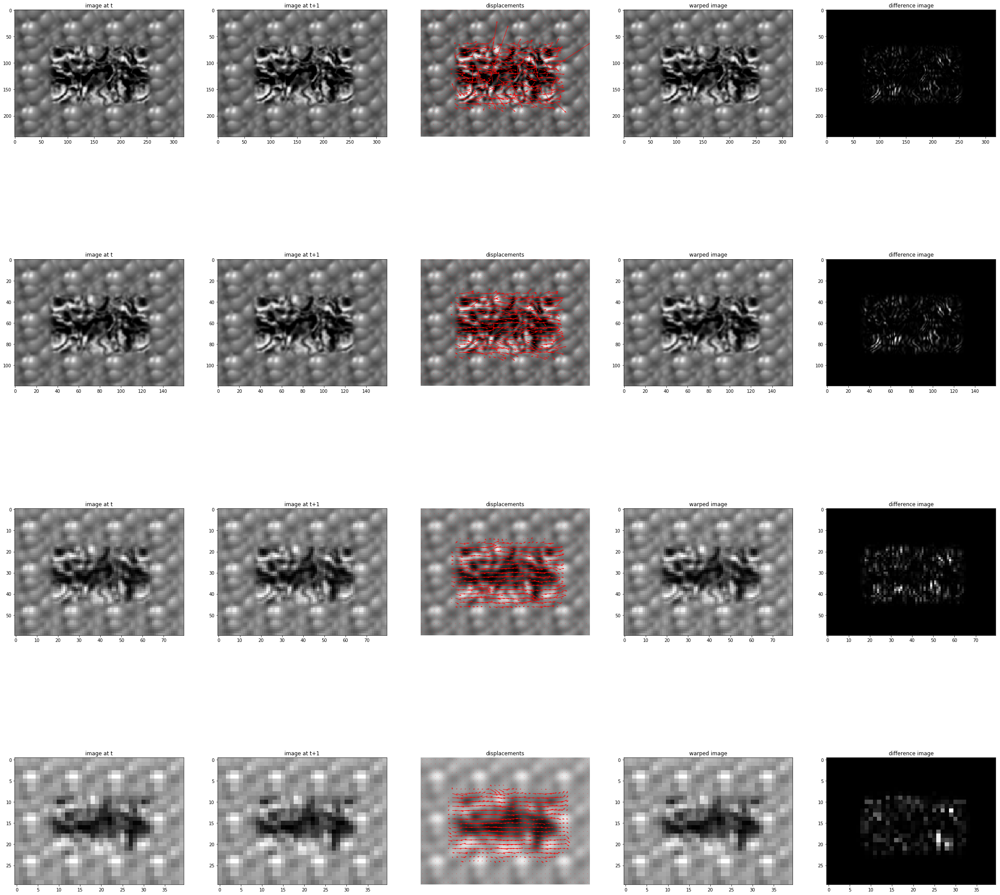

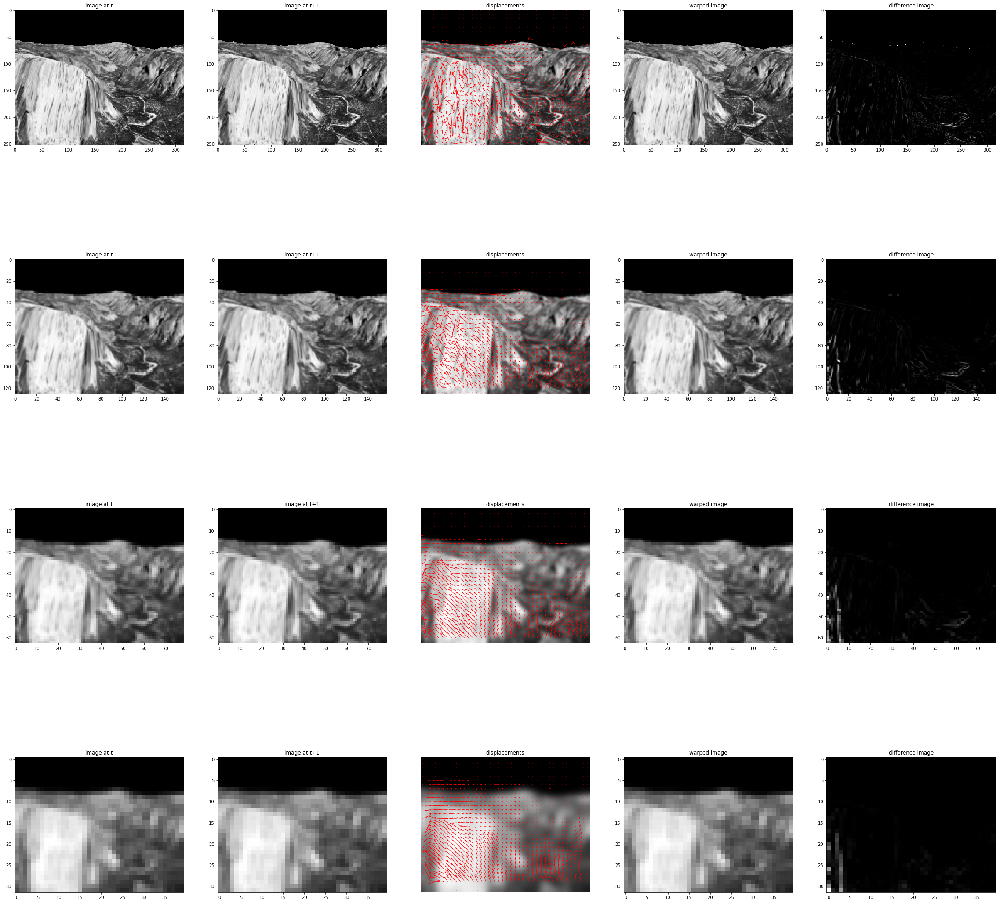

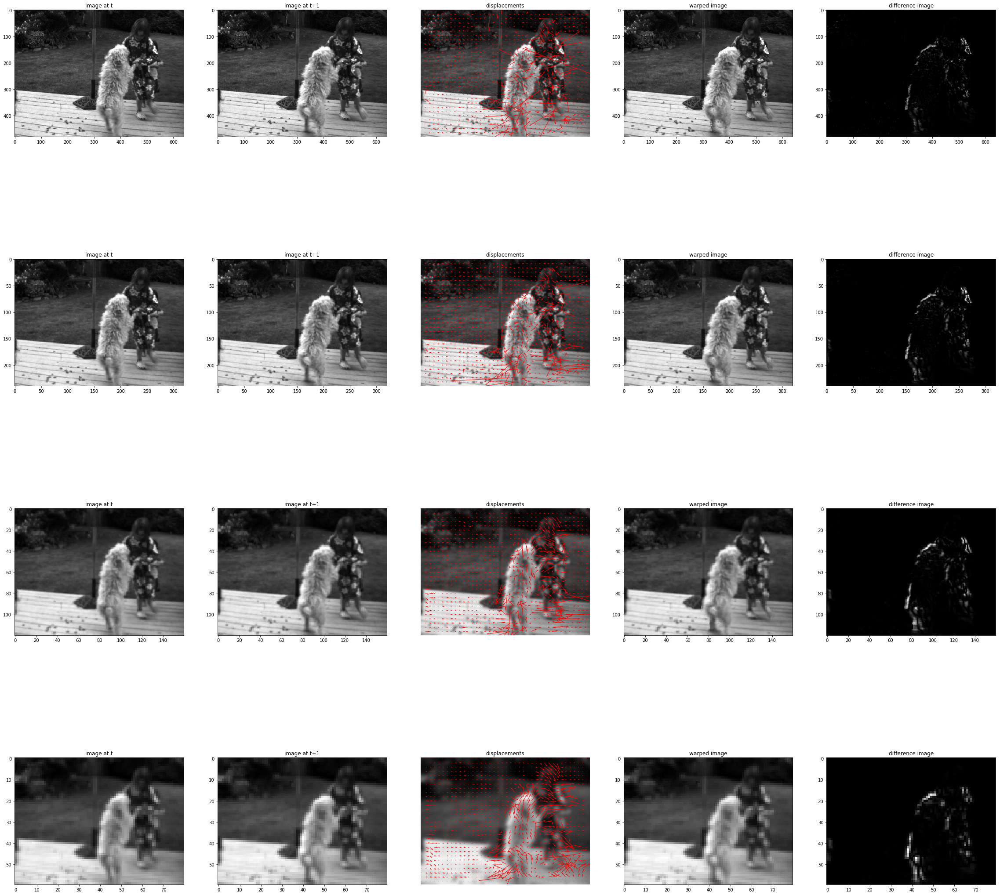

In [55]:
plotSteps(shift0,shift2)
plotSteps(dataSeq1[0],dataSeq1[1])
plotSteps(dataSeq2[0],dataSeq2[1])

### Part 3 : Hierarchical LK optic flow

In [47]:
def hierarLK(L,R,maxlevel):
    im_l = checkGrayScale(L)
    im_r = checkGrayScale(R)
    pyr_l = pyramidGauss(im_l,4,maxlevel)
    pyr_r = pyramidGauss(im_r,4,maxlevel)
    u,v=[],[]
    for k in np.arange(maxlevel-1,-1,-1):
        l_k = pyr_l[k]
        r_k = pyr_r[k]
        if(k==maxlevel-1):
            u,v = np.zeros(l_k.shape),np.zeros(l_k.shape)
        else:
            u,v = 2*EXPAND(u),2*EXPAND(v)
            u,v = u[:r_k.shape[0],:r_k.shape[1]],v[:r_k.shape[0],:r_k.shape[1]]
            w_k = warp(l_k,u,v)
            w_k = w_k
            d_x,d_y = LKstep(w_k.astype(np.float),r_k.astype(np.float))
            u,v = u+d_x,v+d_y
    return u,v

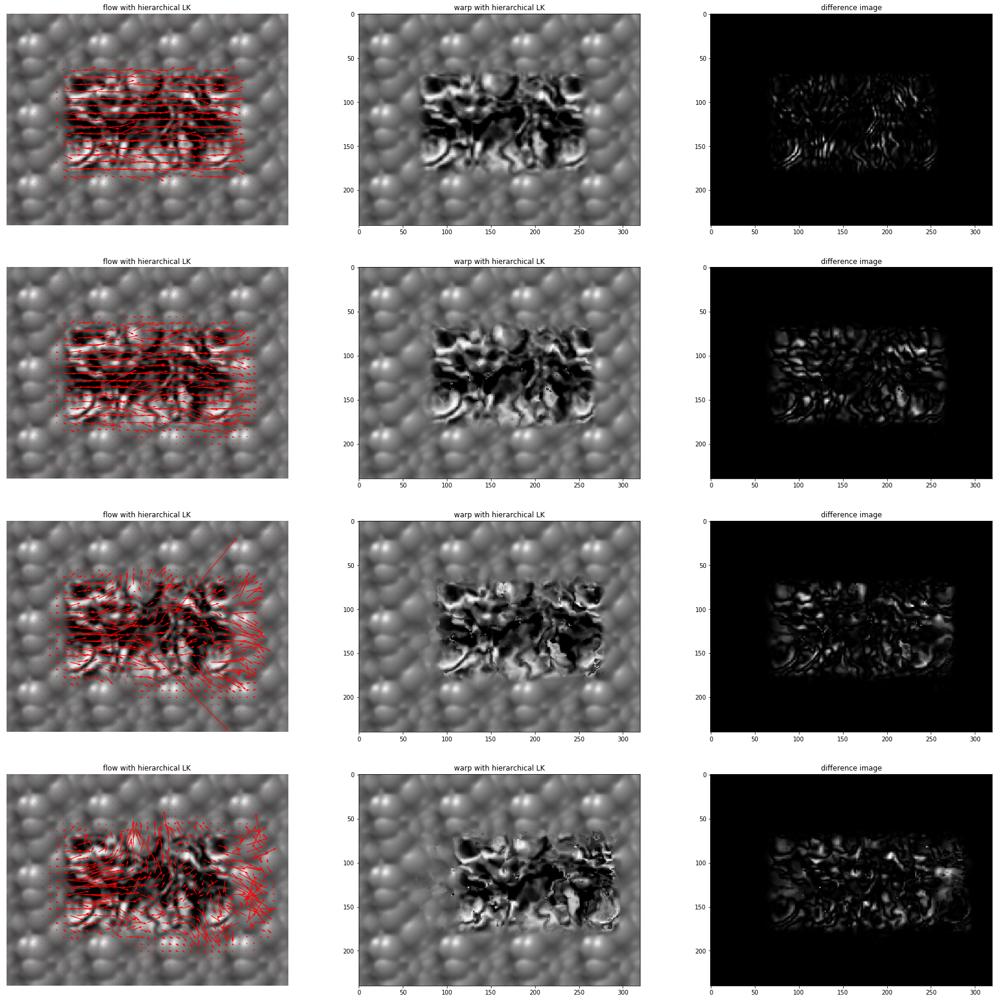

In [49]:
shift10 = testSeq[2]
shift20 = testSeq[4]
shift40 = testSeq[5]



u1,v1 = hierarLK(shift0,shift2,4)



w1 = warp(shift2,u1,v1)





plt.figure(figsize=(30,30))
plt.subplot(431),plotQuiver(u1,v1,shift0),plt.title('flow with hierarchical LK')
plt.subplot(432),plt.imshow(w1,cmap='gray'),plt.title('warp with hierarchical LK')
plt.subplot(433),plt.imshow(norm(np.square(np.subtract(w1.astype(np.float),shift0.astype(np.float)))),cmap='gray'),
plt.title('difference image')
u2,v2 = hierarLK(shift0,shift10,6)
w2 = warp(shift10,u2,v2)

plt.subplot(434),plotQuiver(u2,v2,shift0),plt.title('flow with hierarchical LK')
plt.subplot(435),plt.imshow(w2,cmap='gray'),plt.title('warp with hierarchical LK')
plt.subplot(436),plt.imshow(norm(np.square(np.subtract(w2.astype(np.float),shift0.astype(np.float)))),cmap='gray'),
plt.title('difference image')
u3,v3 = hierarLK(shift0,shift20,6)
w3 = warp(shift20,u3,v3)

plt.subplot(437),plotQuiver(u3,v3,shift0),plt.title('flow with hierarchical LK')
plt.subplot(438),plt.imshow(w3,cmap='gray'),plt.title('warp with hierarchical LK')
plt.subplot(439),plt.imshow(norm(np.square(np.subtract(w3.astype(np.float),shift0.astype(np.float)))),cmap='gray'),
plt.title('difference image')
u4,v4 = hierarLK(shift0,shift40,6)
w4 = warp(shift40,u4,v4)

plt.subplot(4,3,10),plotQuiver(u4,v4,shift0),plt.title('flow with hierarchical LK')
plt.subplot(4,3,11),plt.imshow(w4,cmap='gray'),plt.title('warp with hierarchical LK')
plt.subplot(4,3,12),plt.imshow(norm(np.square(np.subtract(w4.astype(np.float),shift0.astype(np.float)))),cmap='gray'),
plt.title('difference image')
plt.show()

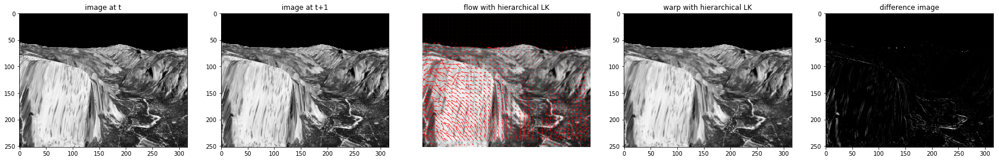

In [50]:
dataSeq1_0 = cp.deepcopy(dataSeq1[0])
dataSeq1_1 = cp.deepcopy(dataSeq1[1])



u1,v1 = hierarLK(dataSeq1_0,dataSeq1_1,4)



w1 = warp(dataSeq1_1,u1,v1)


def plotHier(im1,im2,warp_im,u,v):
    
    plt.figure(figsize=(30,30))
    plt.subplot(151),plt.imshow(im1,cmap='gray'),plt.title('image at t')
    plt.subplot(152),plt.imshow(im2,cmap='gray'),plt.title('image at t+1')

    plt.subplot(153),plotQuiver(u,v,im1),plt.title('flow with hierarchical LK')
    plt.subplot(154),plt.imshow(warp_im,cmap='gray'),plt.title('warp with hierarchical LK')
    plt.subplot(155),plt.imshow(norm(np.square(np.subtract(warp_im.astype(np.float),im1.astype(np.float)))),cmap='gray'),
    plt.title('difference image')

    plt.show()

plotHier(dataSeq1_0,dataSeq1_1,w1,u1,v1)

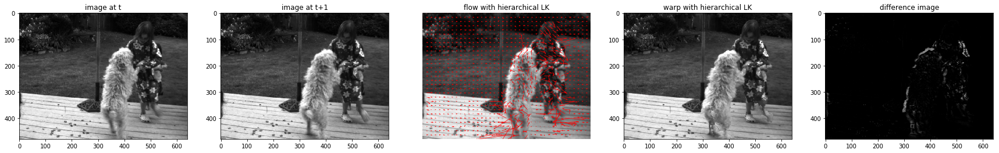

In [51]:
dataSeq2_0 = cp.deepcopy(dataSeq2[0])
dataSeq2_1 = cp.deepcopy(dataSeq2[1])



u1,v1 = hierarLK(dataSeq2_0,dataSeq2_1,4)



w1 = warp(dataSeq2_1,u1,v1)





plotHier(dataSeq2_0,dataSeq2_1,w1,u1,v1)

### Part 4 : The Juggle Sequence

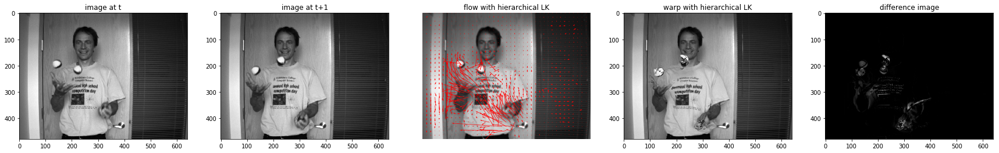

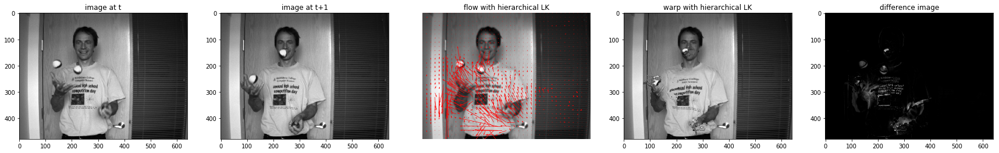

In [52]:
juggle_0 = cp.deepcopy(juggle[0])
juggle_1 = cp.deepcopy(juggle[1])
juggle_2 = cp.deepcopy(juggle[2])


u1,v1 = hierarLK(juggle_0,juggle_1,8)

u2,v2 = hierarLK(juggle_0,juggle_2,8)

w1 = warp(juggle_1,u1,v1)

w2 = warp(juggle_2,u2,v2)



plotHier(juggle_0,juggle_1,w1,u1,v1)
plotHier(juggle_0,juggle_2,w2,u2,v2)

### Part 5 : The Taxi Sequence

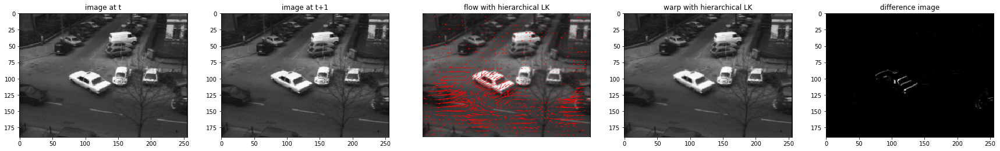

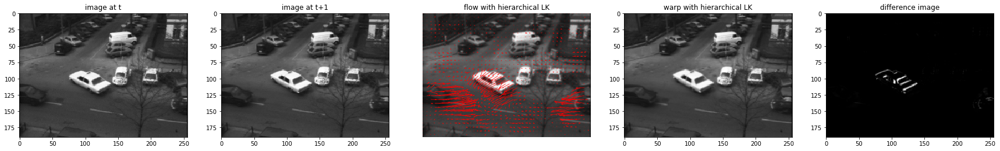

In [53]:
taxis_0 = cp.deepcopy(taxis[1])
taxis_1 = cp.deepcopy(taxis[2])
taxis_3 = cp.deepcopy(taxis[5])


u1,v1 = hierarLK(taxis_0,taxis_1,6)
u2,v2 = hierarLK(taxis_0,taxis_3,6)



w1 = warp(taxis_1,u1,v1)
w2 = warp(taxis_3,u2,v2)




plotHier(taxis_0,taxis_1,w1,u1,v1)
plotHier(taxis_0,taxis_3,w2,u2,v2)
